# End-to-end Multi-class Dog breed classification model

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub

# 1. Problem

Identifying the breed of a dog by providing an image of a dog.

# 2. Data

The data we'er using is taken from Kaggle's dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification/data 

# 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

# 4. Features

Some information about the data:
* We're dealing with images (unstructured data) so it's probably best we use deep learning/ transfer learning.
* There are 120 breeds of dogs i.e there are 120 different classes.
* There are around 10,000+ images in the test set (these images have labels)
* There are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them)


In [1]:
# Unzip the uploaded data

Get your workspace ready


In [2]:
# Import tensorflow into Colab
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("TF Hub version", hub.__version__)

# Check for GPU availability
print("GPU", "Available" if tf.config.list_physical_devices("GPU") else "Not available")

TF version: 2.3.0
TF Hub version 0.10.0
GPU Available


Getting our data ready

With all machine learning models, our data has to be in numerical format. So that's what we'll be doing first. Turning our images into tensors (numerical representation).

In [3]:
# Checkout labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/My Drive/Dog vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     2ca6d2b7ebaab8a73dbaec14c46b4461  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


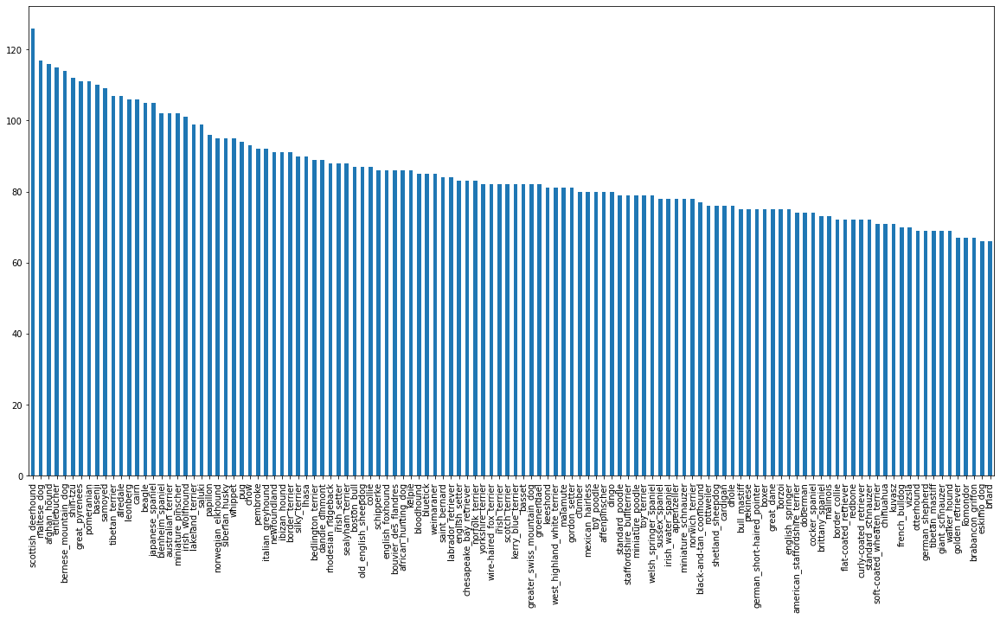

In [4]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [5]:
labels_csv["breed"].value_counts().median(), labels_csv["breed"].value_counts().mean()

(82.0, 85.18333333333334)

In [6]:
# Viewing an image
from IPython.display import Image
# Image("drive/My Drive/Dog vision/train/0a7f8d31c960071d0d4cfba36c0159c7.jpg")

# Getting images and their labels

Let's get a list of all our images file pathnames

In [7]:
# Creating pathnames with image ID's
filenames = ["drive/My Drive/Dog vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]
filenames[:10]

['drive/My Drive/Dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Dog vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Dog vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Dog vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Dog vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Dog vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Dog vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [9]:
# Check whether no. of filenames matches number of actual image files
import os
if len(os.listdir("drive/My Drive/Dog vision/train")) == len(filenames):
  print("Filenames match actual amount of files")
else:
  print("Filenames do not match actual no. of files, check target directory")

Filenames match actual amount of files


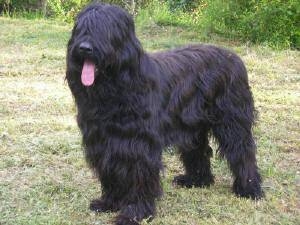

In [10]:
# One more check
Image(filenames[8970])

In [11]:
labels_csv["id"][8970], labels_csv["breed"][8970]

('e13bcf54507eaba884de1faea9af4dd9', 'bouvier_des_flandres')

In [12]:
import numpy as np
labels = labels_csv["breed"]
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [13]:
len(labels)

10222

In [14]:
if len(labels) == len(filenames):
  print("Number of labels matches no. of filenames")
else:
  print("Number doesn't match")

Number of labels matches no. of filenames


In [15]:
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [16]:
# Turn label into array of booleans
print(labels[0])
labels[0] == unique_breeds


boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [17]:
# Turn every label into boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [18]:
len(boolean_labels)

10222

In [19]:
# Example : Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be 1 where sample label occurs


boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [20]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


# Create validation set

In [21]:
# Setup x & y variables
x = filenames
y = boolean_labels

# Starting with 1000 images and increasing as needed

In [22]:
# Set no. of images to use for experiment
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10222, step:1000}

In [23]:
# Split data train & validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
x_train, x_val, y_train, y_val = train_test_split(x[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(x_train), len(y_train), len(x_val), len(y_val)

(800, 800, 200, 200)

In [24]:
x_train[:5], y_train[:5]

(['drive/My Drive/Dog vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/My Drive/Dog vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/My Drive/Dog vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/My Drive/Dog vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/My Drive/Dog vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, Fa

Preprocessing Images (turning images into Tensors)

To preprocess images into tensors we're going to write a function which does a few things
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` into Tensors
4. Resize the `image` to be a shape of (224, 224)
5. Return the modified `image`

Let's see what importing an image looks like

In [25]:
# Convert image to numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [26]:
image.max(), image.min()

(255, 0)

In [27]:
# Convert image to a tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

Now we've seen what an image looks as a tensor let's make a fucntion to preprocess them.
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, image
3. Turn our image into Tensors
4. Normalize our image(convert color channel values from 0-255 to 0-1.
5. Resize the image to be a shape of (224, 224)
6. Return the modified image

In [28]:
# Define image size
IMG_SIZE = 224

# Create a fucntion for preprocessing images
def process_image(image_path):

  """
  Takes an image file path and turns the image into a tensor.
  """
  # Read in an image file 
  image = tf.io.read_file(image_path)

  # Turn the jpeg into numerical Tensor with 3 color channel (RGB)
  image = tf.image.decode_jpeg(image, channels=3)

  # Convert colour channel va,ues from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)

  #Resize image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

In [29]:
tensor = tf.io.read_file(filenames[26])
tensor

<tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x01\xf4\x01w\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca

In [30]:
tensor = tf.image.decode_jpeg(tensor, channels=3)

In [31]:
tf.image.convert_image_dtype(tensor, tf.float32)

<tf.Tensor: shape=(500, 375, 3), dtype=float32, numpy=
array([[[0.23137257, 0.26666668, 0.25490198],
        [0.2509804 , 0.28627452, 0.27450982],
        [0.2784314 , 0.3137255 , 0.3019608 ],
        ...,
        [0.45098042, 0.5019608 , 0.42352945],
        [0.45098042, 0.5019608 , 0.42352945],
        [0.43137258, 0.48235297, 0.4039216 ]],

       [[0.25490198, 0.2901961 , 0.2784314 ],
        [0.28235295, 0.31764707, 0.30588236],
        [0.30980393, 0.34509805, 0.33333334],
        ...,
        [0.44705886, 0.49803925, 0.41960788],
        [0.45882356, 0.50980395, 0.43137258],
        [0.454902  , 0.5058824 , 0.427451  ]],

       [[0.26666668, 0.3019608 , 0.2901961 ],
        [0.29803923, 0.33333334, 0.32156864],
        [0.3254902 , 0.36078432, 0.34901962],
        ...,
        [0.44705886, 0.49803925, 0.41960788],
        [0.47058827, 0.52156866, 0.4431373 ],
        [0.48235297, 0.53333336, 0.454902  ]],

       ...,

       [[0.6784314 , 0.7843138 , 0.60784316],
        [0.64

## Turning our data into batches

When Processing a large no. of images in one go, they might not fit into memory.

So that's why we process 32 images (which is the batch size) at a time (we can manually adjust the batch size)

In order to use TensorFlow effectively, we need our data in he form of Tensor tuples which look likes this:
`(image, label)`.

In [32]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label, process the image and return the image and return a tuple of (image, label)
  """
  image = process_image(image_path)
  return image, label

In [33]:
# Demo of the above
(process_image(x[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form: `(image, label)`, let's make a function to turn all of our data (x & y) into batches

In [34]:
# Define batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn all our data into batches
def create_data_batches(x, y=None, batch_size = BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (x) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)                                        
    return data_batch 
  
  else:
    print("Creating training data batches...")

    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(x))
    
    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
    
  return data_batch

In [35]:
# Creating training and testing data
train_data = create_data_batches(x_train, y_train)
val_data = create_data_batches(x_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [36]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualization Data Batches

Our Data is now in batches, however, these can be a little hard to understand/comprehend, let's visualize them

In [37]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5,5,i+1)
    # Displaying image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the frid lines off
    plt.axis("off")

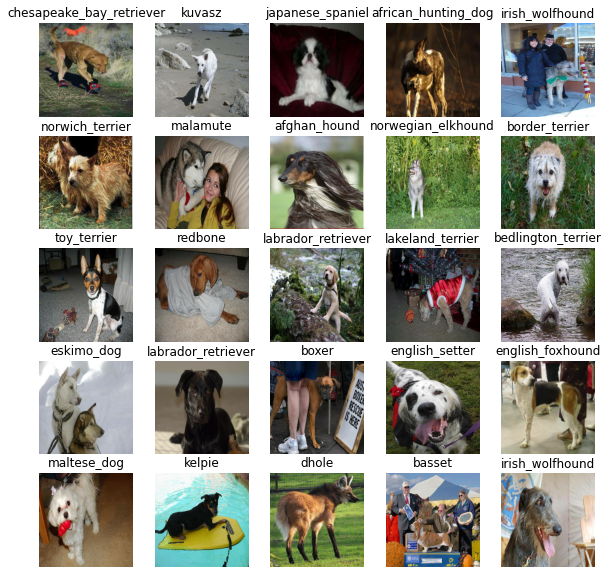

In [38]:
# Visualizing the data in training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

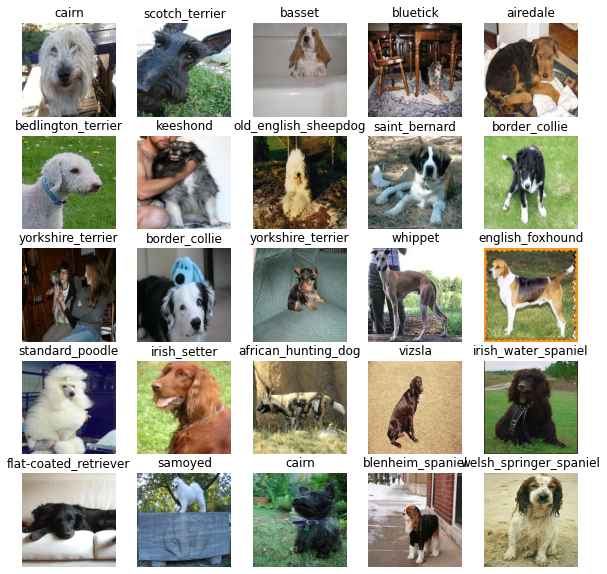

In [39]:
# Visualizing the validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before building a model we need to define:
* The input shape (our images shape, in the form of Tensors) to our model
* The output shape (image labels, in the form of Tensors) of our model
* The URL of the model we want to use

In [40]:
# Setup input shape to the model

INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, color channels

# Setup out shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setupe modle URL from Tensorflow hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

Now we've got our inputs, outputs and model ready to go.
Let's put them together into a Keras deep learning model

Knowing this, let's create a function which:
* Takes input shape, output shape and the model we've choosen as in parameters.
* Defines the layers in a Keras model in a sequential fashion.
* Compiles the model (says it should beevaluated and improved).
* Builds the models (tells the model the input shape it'll be getting).
* Returns the models

All of these steps can be found here: https://www.tensorflow.org/guide/keras/overview

In [41]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Build model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Input layer
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Output layer
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)
  
  return model

In [42]:
model = create_model()
model.summary()

Build model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer (KerasLayer)     (None, 1001)              5432713   
_________________________________________________________________
dense (Dense)                (None, 120)               120240    
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check it's progress or stop training early if a model stops improving.

We'll create 2 callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

## TensorBoard Callback

To setup a TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension
2. Create a TensorBoard callback whcih is able to save logs to a dictionary and pass it to our model's fit() function.
3. Visualize our models training logs with the tensorboard magic funtion (we'll do this after model training).


In [43]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [44]:
import datetime

# Create a function to  build a TensorBoard callback
def create_tensorboard_callback():

  # Create a log directory for storing tensorboard logs
  logdir = os.path.join("drive/My Drive/Dog vision/logs", # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early stopping callback

Early stopping helps our model from overfitiing by stopping training if a certain evaluation metric stops improving

In [45]:
# Create early stopping callabcks
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                   patience=3)

## Training a model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [46]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [47]:
print("GPU", "avalaible" if tf.config.list_physical_devices("GPU") else "Not available")

GPU avalaible


Let's create a function which trains a model.

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochsto train for `(NUM_EPOCHS)` and the callbacks we'd like to use.
* Return the model

In [48]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version
  """

  # Create a model
  model = create_model()

  # Create a new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit model to the data passing the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  
  # Return the fitted model
  return model

In [49]:
# Fit the model

model = train_model()

Build model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
 1/25 [>.............................] - ETA: 0s - loss: 5.7628 - accuracy: 0.0000e+00WARNING:tensorflow:From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/summary_ops_v2.py:1277: stop (from tensorflow.python.eager.profiler) is deprecated and will be removed after 2020-07-01.
Instructions for updating:
use `tf.profiler.experimental.stop` instead.


Instructions for updating:
use `tf.profiler.experimental.stop` instead.


25/25 [==============================] - 342s 14s/step - loss: 4.5183 - accuracy: 0.0925 - val_loss: 3.3085 - val_accuracy: 0.2950
Epoch 2/100
25/25 [==============================] - 4s 152ms/step - loss: 1.6189 - accuracy: 0.6938 - val_loss: 2.1425 - val_accuracy: 0.5150
Epoch 3/100
25/25 [==============================] - 4s 160ms/step - loss: 0.5581 - accuracy: 0.9388 - val_loss: 1.6485 - val_accuracy: 0.6050
Epoch 4/100
25/25 [==============================] - 4s 159ms/step - loss: 0.2523 - accuracy: 0.9887 - val_loss: 1.4722 - val_accuracy: 0.6150
Epoch 5/100
25/25 [==============================] - 4s 150ms/step - loss: 0.1488 - accuracy: 0.9950 - val_loss: 1.3943 - val_accuracy: 0.6300
Epoch 6/100
25/25 [==============================] - 4s 150ms/step - loss: 0.1006 - accuracy: 1.0000 - val_loss: 1.3366 - val_accuracy: 0.6500
Epoch 7/100
25/25 [==============================] - 4s 149ms/step - loss: 0.0758 - accuracy: 1.0000 - val_loss: 1.3138 - val_accuracy: 0.6600
Epoch 8/100

**Overfitting to begin with is a good thing, it means our model is learning**

In [50]:
%tensorboard --logdir drive/My\ Drive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [51]:
# Making predictions on validation data (not used to train on)

predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 92ms/step


array([[4.07100597e-04, 2.61553887e-05, 2.73774611e-03, ...,
        6.18429214e-04, 2.24121450e-05, 1.33453449e-03],
       [6.79318735e-04, 4.34623245e-04, 2.24506501e-02, ...,
        1.42059813e-04, 1.59708969e-03, 6.32599185e-05],
       [2.74775857e-06, 1.14455561e-05, 1.10708261e-05, ...,
        5.78556319e-06, 6.13300517e-06, 8.52293015e-05],
       ...,
       [4.24108566e-06, 4.50440302e-06, 4.56145463e-05, ...,
        2.35025436e-06, 3.92599177e-05, 7.39994721e-05],
       [4.04743390e-04, 6.48314235e-05, 8.48880300e-05, ...,
        1.30344546e-04, 2.70266064e-05, 5.19031892e-03],
       [1.12215785e-04, 5.28276996e-06, 2.39729387e-04, ...,
        1.00315735e-03, 5.42781083e-04, 2.42512651e-05]], dtype=float32)

In [52]:
predictions[0]

array([4.07100597e-04, 2.61553887e-05, 2.73774611e-03, 1.21341945e-04,
       2.89649237e-04, 4.54785477e-05, 1.08872820e-02, 2.56085943e-04,
       8.94922181e-04, 2.42510825e-04, 7.60722614e-04, 1.03914848e-04,
       5.72779609e-05, 1.24714526e-04, 1.48427949e-04, 1.89705775e-03,
       2.55370760e-05, 1.56432092e-01, 1.56934657e-05, 1.67042854e-05,
       6.60978258e-04, 3.83341016e-04, 2.01071580e-05, 1.56004506e-03,
       2.49041390e-04, 7.51668049e-05, 1.21809326e-01, 2.06873610e-05,
       3.78529017e-04, 1.89640035e-04, 6.40772923e-05, 5.11467969e-03,
       8.20181449e-05, 1.78924020e-04, 2.33086219e-04, 6.20842017e-02,
       1.05987841e-04, 3.42449115e-04, 1.36727147e-04, 4.21187833e-05,
       6.66374690e-04, 1.71459033e-04, 3.80681566e-04, 5.89718802e-05,
       8.56555471e-06, 2.96028273e-04, 7.27483566e-05, 1.14946997e-04,
       1.18239899e-03, 3.90301429e-05, 6.05633613e-05, 3.36412122e-05,
       3.87060689e-04, 1.13513488e-05, 1.91428378e-04, 1.28226966e-04,
      

In [53]:
predictions.shape

(200, 120)

In [54]:
len(predictions[0])

120

In [55]:
np.sum(predictions[0])

1.0

In [56]:
# First prediction
index = 51
print(predictions[index])
print(f"Max value (probability of prediciton): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")


[1.23191057e-04 1.59367090e-04 3.28584210e-05 3.68073874e-04
 1.95283923e-04 6.80837038e-05 4.58645991e-05 5.78390609e-05
 9.21401428e-04 1.26516912e-03 1.68888958e-03 1.40379257e-06
 1.60315726e-03 1.28475795e-05 2.10038237e-02 5.55635849e-03
 7.65640834e-06 6.31621151e-05 1.49290165e-04 2.24111263e-05
 3.34990647e-04 5.17912675e-03 6.21982676e-04 3.73967545e-04
 2.44840048e-02 1.52836449e-03 6.95168492e-05 2.49048844e-06
 9.73285362e-02 5.74135884e-05 4.60848725e-07 7.96448847e-04
 3.14803387e-04 2.78212701e-06 1.83555967e-04 2.92327022e-04
 2.52413540e-03 1.20231911e-04 1.00927101e-03 1.86649198e-03
 5.47369884e-04 1.37316674e-05 1.88679856e-04 5.73217876e-05
 3.17353086e-04 4.23977217e-05 9.84215294e-05 2.01795492e-02
 8.34680322e-05 3.45246377e-03 7.83887226e-04 1.41621474e-03
 4.36476839e-05 1.93298841e-03 2.55080740e-05 1.37498113e-03
 5.47806034e-03 4.18958021e-04 1.61336653e-03 1.47509782e-05
 1.72892978e-04 1.48386418e-04 5.92739263e-04 3.01559157e-05
 4.65237281e-05 9.849914

In [57]:
unique_breeds[90]

'rhodesian_ridgeback'

Having the above functionality, we want to be able to scale it

And it would be better if we could see the image the prediciton is being made open

**Note :** Prediciton probabilities are also known as confidence levels

In [58]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediciton_probabilities):
  """
  Turns an array of prediction probabilities into a label
  """
  return unique_breeds[np.argmax(prediciton_probabilities)]

# Get a predicted label based on an array of prediciton probabilities
pred_label = get_pred_label(predictions[23])
pred_label

'blenheim_spaniel'

Since our validation data is still in a batch dataset, we'll have to unbatchify it to make predicitons on the validation images and then compare those predicitions ot the validation labels (truth labels).

In [59]:
val_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [60]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batch dataset of (image,label) Tensors and returns seperate arrays
  of images and labels.
  """
  images = []
  labels = []
  
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [61]:
get_pred_label(val_labels[0])

'affenpinscher'

In [62]:
images_ = []
labels_ = []

# Loop through unbatched data
for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0], labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [63]:
get_pred_label(labels_[0])

'cairn'

In [64]:
get_pred_label(predictions[0])

'soft-coated_wheaten_terrier'

Now we've got ways to get:
* Prediction labels
* Validation labels (truth labels)
* Validation images 

Let's make some function to make these all a bit more visualize.

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and integers.
* Convert the prediciton probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and the target image on aisngle plot.

In [65]:
def plot_pred(prediciton_probabilities, labels, images, n=1):
  """
  View the prediciton ground truth and image for sample n
  """
  pred_prob, true_label, image = prediciton_probabilities[n], labels[n], images[n]

  # Get pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change colour of title depending on prediction bwing right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"
  # Plot title
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)
  pass

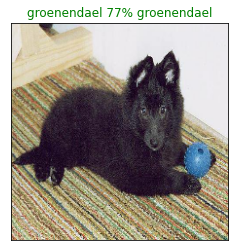

In [66]:
plot_pred(prediciton_probabilities=predictions,
           labels=val_labels,
           images=val_images,
           n=77)

* Visualizing our models top 10 predictions

* We'll take an input of prediciton probabilities array and a ground truth array and an integer. 

* Finding top 10:
   1. Prediciton probabilities indexes
   2. Prediciton probabilities values
   3. Prediciton labels
 
* Plot the top 10 prediciton probability values and labels, coloring the true one in green


In [67]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plot the top 10 highest prediciton confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get predicited labels
  pred_labels = get_pred_label(pred_prob)

  # Find top 10 
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                      top_10_pred_values,
                      color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
              labels=top_10_pred_labels,
              rotation="vertical")
  
  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

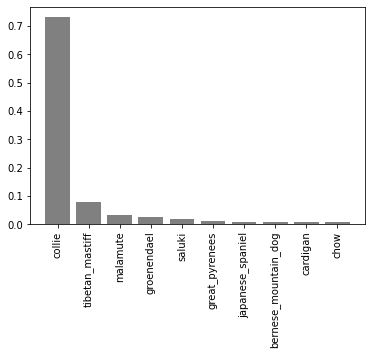

In [68]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
                n=9)

Now we've got some function to help us visualize our predictions and evaluate our model. let's check out

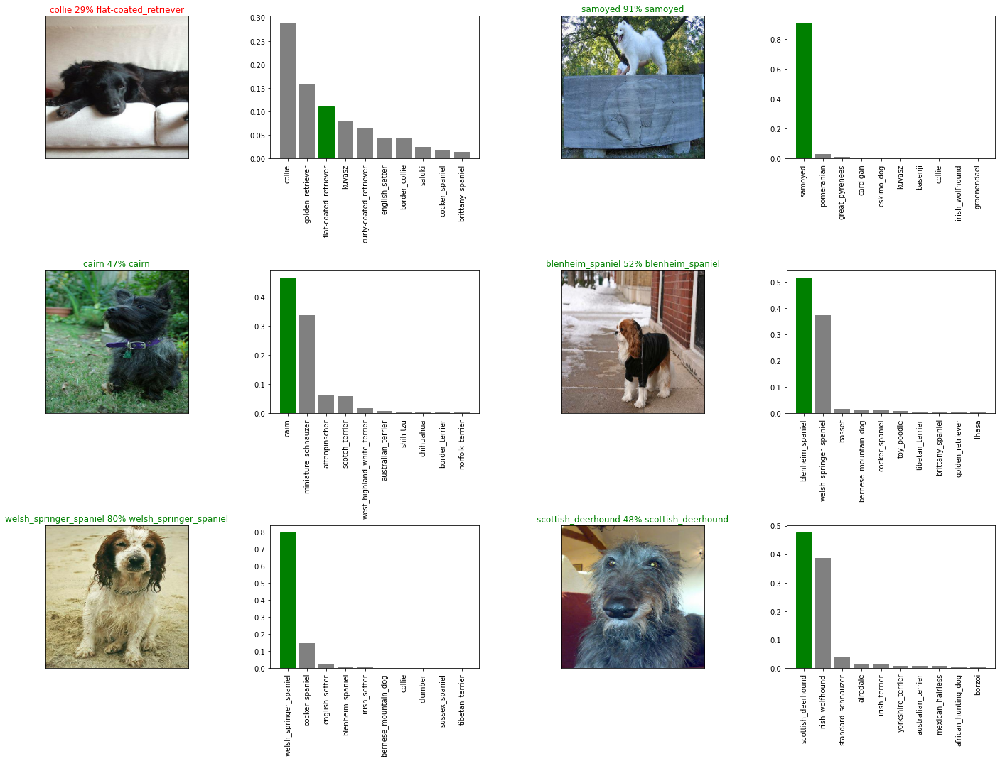

In [69]:
# Let's check out a few predicitons and their different values 
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediciton_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading a trained model

In [70]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/My Drive/Dog vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [71]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path, 
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Now we've got funtions to save and load a trained model, let's make sure they work

In [72]:
# Save our model rained over 1000 images
save_model(model,suffix="1000-images-mobilenetv2-Adam")


Saving model to: drive/My Drive/Dog vision/models/20201117-11331605612785-1000-images-mobilenetv2-Adam.h5...


'drive/My Drive/Dog vision/models/20201117-11331605612785-1000-images-mobilenetv2-Adam.h5'

In [73]:
# Loading trained model
loaded_1000_image_model = load_model('drive/My Drive/Dog vision/models/20201030-07291604042977-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: drive/My Drive/Dog vision/models/20201030-07291604042977-1000-images-mobilenetv2-Adam.h5


In [74]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 81ms/step - loss: 1.2245 - accuracy: 0.6750


[1.224453330039978, 0.675000011920929]

In [75]:
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 94ms/step - loss: 1.2681 - accuracy: 0.6950


[1.2680857181549072, 0.6949999928474426]

## Training a big dog model (on full data)

In [76]:
len(x), len(y)

(10222, 10222)

In [77]:
x[:10]

['drive/My Drive/Dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Dog vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Dog vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Dog vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Dog vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Dog vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Dog vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [78]:
len(x_train)

800

In [79]:
y[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [80]:
# Create a data batch with the full data set
full_data = create_data_batches(x,y)

Creating training data batches...


In [81]:
full_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [82]:
full_model = create_model()

Build model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [83]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)


**NOTE:** Running the cell below might take more than 60mins(for first epoch) as the GPU we're using in the runtime has to load all images into memory

In [84]:
# Fit the full model to the full data
# full_model.fit(x=full_data,
               # epochs=NUM_EPOCHS,
               # callbacks=[full_model_tensorboard, full_model_early_stopping])

In [85]:
# save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

In [86]:
# Load in full model
loaded_full_model = load_model('/content/drive/MyDrive/Dog vision/models/20201112-08261605169608-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/Dog vision/models/20201112-08261605169608-full-image-set-mobilenetv2-Adam.h5


### Make predicitons on test dataset

Since our model has been trained on images in the form of Tensor batches, to make predicitons on the test data, we'll have to get it into the same format

We have created a function `create_data_batches()` earlier which can take a list of filenames as input and conver them into Tensor batches.

To make predictions on the test data, we'll :
* Get the test image filenames
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since the test data doesn't have labels)
* Make a prediciton array by passing the test batches to the `predict()` method called on our model.


In [87]:
# Load test image filenames
test_path = "drive/My Drive/Dog vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/My Drive/Dog vision/test/f390bb3bac972e70bc612dcf64651eb5.jpg',
 'drive/My Drive/Dog vision/test/f2e4e4f1ab9d156443682dc4653f23e5.jpg',
 'drive/My Drive/Dog vision/test/e857866af777793d2c114b09ea7a685a.jpg',
 'drive/My Drive/Dog vision/test/eaf1a540a86c69877695a63ff9421be5.jpg',
 'drive/My Drive/Dog vision/test/e9b105a5b7873f33477f777d5a9447f8.jpg',
 'drive/My Drive/Dog vision/test/ef510b25dc13743d566b719b41b35e92.jpg',
 'drive/My Drive/Dog vision/test/f30a644551716969a8a4dd6bdbcac8d5.jpg',
 'drive/My Drive/Dog vision/test/e9727fde8aa044a5a2c18b84170f5619.jpg',
 'drive/My Drive/Dog vision/test/e9615e7f30ffcf6d705ce9cbcb6d688c.jpg',
 'drive/My Drive/Dog vision/test/f42473f75caedac6010537ddd05b1a86.jpg']

In [88]:
len(test_filenames)

10357

In [89]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [90]:
test_data

<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

**NOTE:** Calling `predict()` on our full model and passing it the test data batch will take a long time to run (about 1hr)

In [92]:
# Make prediction on test data batches usinf the loaded full model
# test_predictions = loaded_full_model.predict(test_data,
                                             # verbose=1)

In [94]:
# Save predicitons (NumPy arrat) to csv file (for access later)
# np.savetxt("drive/My Drive/Dog vision/preds_array.csv", test_predictions, delimiter=",")

In [95]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("drive/My Drive/Dog vision/preds_array.csv", delimiter=",")

In [97]:
test_predictions[:10]

array([[7.18905879e-10, 4.40290506e-07, 1.93476968e-09, ...,
        1.90528098e-07, 1.75785123e-10, 3.86177987e-08],
       [7.96250461e-08, 9.44537959e-08, 5.83143032e-04, ...,
        2.73318960e-07, 2.12324267e-06, 1.35205680e-09],
       [5.80379841e-11, 5.35075942e-11, 1.04665032e-08, ...,
        2.80482651e-11, 3.83795218e-10, 7.45823542e-12],
       ...,
       [3.42251951e-08, 2.18060281e-09, 4.56274324e-10, ...,
        5.87917492e-10, 1.59348576e-10, 2.51444865e-09],
       [1.04243969e-09, 4.94128558e-11, 1.08586455e-05, ...,
        3.77685332e-08, 4.61398801e-11, 1.22388766e-10],
       [1.94438174e-10, 6.05220951e-13, 1.20829606e-14, ...,
        9.71519262e-15, 1.46321089e-09, 4.42694145e-11]])

In [99]:
test_predictions.shape

(10357, 120)

### Preparing test dataset predictions for Kaggle

Looking at the Kaggle sample submission, it looks like they want the models output probabilities each for label along with the image ID's.

To get the data in this format, we'll:
1. Create a pandas DataFrame with an ID column as well as a column for each dog breed.
2. Add data to the ID column by extracting the test image ID's from their filepaths.
3. Add data (the prediction probabilities) to each of the dog breed columns using the unique_breeds list and the test_predictions list.
4. Export the DataFrame as a CSV to submit it to Kaggle.

In [100]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [101]:
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]

In [102]:
os.path.splitext(test_filenames[0])

('drive/My Drive/Dog vision/test/f390bb3bac972e70bc612dcf64651eb5', '.jpg')

In [103]:
test_ids

['f390bb3bac972e70bc612dcf64651eb5',
 'f2e4e4f1ab9d156443682dc4653f23e5',
 'e857866af777793d2c114b09ea7a685a',
 'eaf1a540a86c69877695a63ff9421be5',
 'e9b105a5b7873f33477f777d5a9447f8',
 'ef510b25dc13743d566b719b41b35e92',
 'f30a644551716969a8a4dd6bdbcac8d5',
 'e9727fde8aa044a5a2c18b84170f5619',
 'e9615e7f30ffcf6d705ce9cbcb6d688c',
 'f42473f75caedac6010537ddd05b1a86',
 'eee7c863af47e22f285f8aeb80adb4b9',
 'ed3c3d91c25ad370e44704caa4bc1c63',
 'eb2e408930e0873deb85484ef46f07fd',
 'e92455b9e6291d0f192f23ccd4e0be3a',
 'ec89476b99aab390011acee436f9642a',
 'e8319b1410a984291d71a3e60c84d86c',
 'ee878152e29a6b6ce288b44b358f9d05',
 'ec363521d5ebd5260944823f86dc5a8c',
 'f5941a13b02860ade9b93987a18a8636',
 'ff71c0a7a71d994884c9f92457f0eda8',
 'f82a903b13fb1d4331d889847d93259f',
 'fa72bd6f479a51c33c8b92970c834954',
 'fe041e832bf172724002ad779f924497',
 'fd1a7be32f10493735555e62913c0841',
 'f8bfe5da20567378b885109a0c1f1483',
 'fe3175f577485cbc3cb70a1fd5e0394f',
 'f9f0c9be21215d50d8a2994ef0f9f416',
 

In [104]:
preds_df["id"] = test_ids

In [105]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,f390bb3bac972e70bc612dcf64651eb5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,f2e4e4f1ab9d156443682dc4653f23e5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e857866af777793d2c114b09ea7a685a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,eaf1a540a86c69877695a63ff9421be5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e9b105a5b7873f33477f777d5a9447f8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [107]:
# Add prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,f390bb3bac972e70bc612dcf64651eb5,7.18906e-10,4.40291e-07,1.93477e-09,4.3077e-10,1.39306e-08,7.5966e-08,8.34196e-12,2.30722e-10,2.35515e-07,7.50789e-10,7.42042e-11,1.02996e-08,1.9252e-11,5.07951e-12,1.84545e-07,2.88608e-07,3.79243e-08,1.0561e-07,2.28051e-07,3.62165e-09,3.08726e-08,1.15031e-08,1.00369e-06,2.67505e-07,5.63121e-09,1.33173e-05,1.48628e-08,1.19451e-11,3.17879e-09,1.1185e-08,8.73459e-08,1.31451e-07,3.52971e-09,2.5188e-10,2.64844e-12,2.30869e-08,1.23767e-10,3.29962e-10,5.11227e-09,...,1.09796e-07,3.36001e-10,1.98234e-09,1.40118e-08,9.99642e-12,0.641352,1.96618e-10,4.70219e-08,1.54517e-05,1.96769e-09,7.80629e-10,1.0363e-05,2.83637e-05,1.00248e-05,1.00748e-09,7.52768e-10,1.08213e-11,1.02958e-10,1.43414e-07,6.40731e-09,1.45741e-06,7.99601e-10,1.63944e-08,3.90512e-08,7.80618e-13,1.56557e-10,5.95239e-07,3.93452e-09,1.44334e-06,2.2344e-07,1.65163e-08,2.09273e-10,5.31484e-11,8.36248e-11,2.39249e-10,3.32338e-11,3.2115e-13,1.90528e-07,1.75785e-10,3.86178e-08
1,f2e4e4f1ab9d156443682dc4653f23e5,7.9625e-08,9.44538e-08,0.000583143,6.58999e-10,9.17076e-08,1.62327e-06,1.50085e-05,5.80903e-06,7.13202e-10,5.82677e-10,7.96083e-10,2.91771e-06,4.70721e-08,9.23848e-11,1.82997e-08,1.79677e-07,0.0653938,3.79346e-07,2.41038e-06,3.77311e-06,1.27537e-09,3.56592e-11,4.54639e-09,1.81612e-07,3.84347e-08,1.76473e-10,1.46185e-06,0.280892,3.18159e-08,1.33808e-05,1.80812e-08,2.85057e-08,6.07604e-07,0.377307,3.87124e-08,2.80134e-09,0.000299617,1.40627e-06,1.09935e-09,...,2.05185e-05,3.58239e-06,2.34611e-08,2.76851e-08,9.56968e-05,4.25676e-08,0.000259369,4.29864e-07,1.64463e-08,4.5727e-05,1.32903e-08,2.59099e-10,1.3262e-09,3.7212e-08,1.13999e-06,0.139259,9.82112e-06,4.17914e-07,7.34457e-12,5.48716e-06,4.09876e-08,2.66435e-06,5.26117e-08,2.0165e-10,5.83316e-05,1.64563e-07,1.0093e-08,1.24014e-08,2.10164e-07,1.20945e-06,8.64876e-10,3.729e-08,4.89241e-08,1.08161e-07,6.48793e-08,1.31593e-08,4.85758e-06,2.73319e-07,2.12324e-06,1.35206e-09
2,e857866af777793d2c114b09ea7a685a,5.8038e-11,5.35076e-11,1.04665e-08,1.37173e-12,6.2817e-13,7.07669e-10,2.04824e-09,5.62286e-08,7.24174e-09,2.43734e-10,1.5891e-10,6.26537e-11,9.81982e-11,1.40188e-10,1.18504e-07,5.17183e-11,1.19836e-12,3.73916e-10,1.96482e-11,1.45045e-13,3.34776e-11,3.18577e-09,6.88738e-09,2.1359e-12,4.01912e-10,1.65072e-12,2.67359e-12,2.20332e-10,8.57597e-11,2.49836e-10,3.75801e-10,7.84622e-11,1.2002e-12,4.13741e-14,6.45139e-11,8.38929e-13,0.999973,2.5138e-05,1.11613e-10,...,8.24917e-12,1.71027e-09,6.41459e-12,2.37574e-11,5.36665e-11,6.74288e-12,5.24537e-07,1.16657e-11,1.32008e-12,2.13054e-09,2.36635e-09,1.30766e-11,6.07539e-12,1.50039e-10,1.05086e-10,1.76454e-10,4.07916e-10,9.04258e-11,8.73565e-11,4.86647e-10,5.41311e-10,7.42702e-12,6.12019e-08,2.93427e-11,8.69394e-12,1.33405e-10,3.84319e-11,1.06266e-11,3.02349e-12,8.3988e-10,4.76656e-11,1.17397e-07,3.96512e-10,3.13446e-12,2.8278e-11,3.8716e-09,3.15971e-11,2.80483e-

In [109]:
# Saving out predicitons dataframe to csv file type for submission
# preds_df.to_csv("drive/My Drive/Dog vision/full_model_prediction_mobilenetV2.csv",
                # index=False)

## Making predictions on custom images

It's great being able to make predictions on a test dataset already provided for us.
But how could we use our model on our own images?
The premise remains, if we want to make predictions on our own custom images, we have to pass them to the model in the same format the model was trained on.

To make predictions on custom images, we'll:
* Get the filepaths of own images.
* Turn the filepaths into data batches using create_data_batches(). And since our custom images won't have labels, we set the test_data parameter to True.
* Pass the custom image data batch to our model's predict() method.
* Convert the prediction output probabilities to prediction labels.
* Compare the predicted labels to the custom images.

**Note:** To make predictions on custom images, I've uploaded pictures of my own to a directory located at drive/My Drive/dogs/ (as seen in the cell below). In order to make predictions on your own images, you will have to do something similar.

In [167]:
# Get custom image filepaths
custom_path = "drive/My Drive/Dog vision/custom_dog_img/"
custom_image_path = [custom_path + fname for fname in os.listdir(custom_path)]


In [168]:
custom_image_path

['drive/My Drive/Dog vision/custom_dog_img/671_preview.v3.jpg',
 'drive/My Drive/Dog vision/custom_dog_img/21500682-45ce-477a-9f12-94962105d5f2.jpg',
 'drive/My Drive/Dog vision/custom_dog_img/cd7b0a5d-8642-4d6c-81cf-f8b8f894dd7a.jpg',
 'drive/My Drive/Dog vision/custom_dog_img/beagle-detail.jpg']

In [169]:
# Turn custom images into batches of data
custom_data = create_data_batches(custom_image_path, test_data=True)
custom_data

Creating test data batches...


<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

In [170]:
custom_preds = loaded_full_model.predict(custom_data)

In [171]:
custom_preds.shape

(4, 120)

In [172]:
# Get custom image prediction labels 
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['labrador_retriever', 'shih-tzu', 'shih-tzu', 'english_foxhound']

In [173]:
# Get custom images (our unbatchify() function won't work since there aren't labels, maybe we could fix this later)
custom_images = [] 
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)


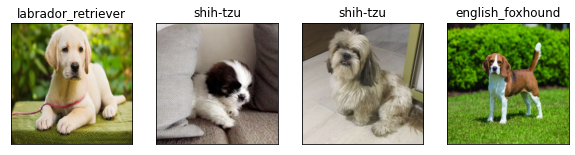

In [175]:
# Check custom image predictions 
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 4, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)